In [1]:
import logging
import os

import elettra_toolbox
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy
from cpymad.madx import Madx, TwissFailed
from matplotlib import cm, gridspec, patches
from pyhdtoolkit import cpymadtools
from pyhdtoolkit.utils import defaults

defaults.config_logger()
plt.rcParams.update({"text.usetex": False})

LOGGER = logging.getLogger()

In [2]:
if os.path.exists("stdout.out"):
    os.remove("stdout.out")

# Launch MAD-X Session
with open("stdout.out", "w") as f:
    madx = Madx(stdout=f)

# Read parameters

from config import parameters, settings

for i in parameters.keys():
    madx.globals[i] = parameters[i]

# Call sequence and optics

madx.call("elettra2_v15_VADER_2.3T.madx")
madx.call("optics_elettra2_v15_VADER_2.3T.madx")

# Initial twiss

madx.use(sequence="ring")
madx.twiss(sequence="ring", table="init_twiss")

# Compute Emittance

madx.input(
    f"""
emit, deltap={madx.globals.deltap};
emit, deltap={madx.globals.deltap};
"""
)

# Get the emittance from the standard output

ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)


print(f"Emittance x : {ex*1e12} pm")

twiss = madx.table.init_twiss.dframe()


# Let's install some markers

madx.input(
    """
left_marker: marker;
right_marker: marker;
middle_marker: marker;

use, sequence=ring;
seqedit, sequence=ring;
flatten;
install, element=left_marker, at=10.8;
install, element=middle_marker, at=21.6;
install, element=right_marker, at=32.4;
flatten;
endedit;
"""
)

madx.use(sequence="ring")
madx.twiss(sequence="ring")
twiss = madx.table.twiss.dframe()

Emittance x : 1031.9436 pm


2021-10-13 15:45:51 | INFO     | pyhdtoolkit.cpymadtools.plotters:638 - Plotting optics functions and machine layout
2021-10-13 15:45:54 | INFO     | pyhdtoolkit.cpymadtools.plotters:695 - Saving latwiss plot as raw_no_AB.pdf


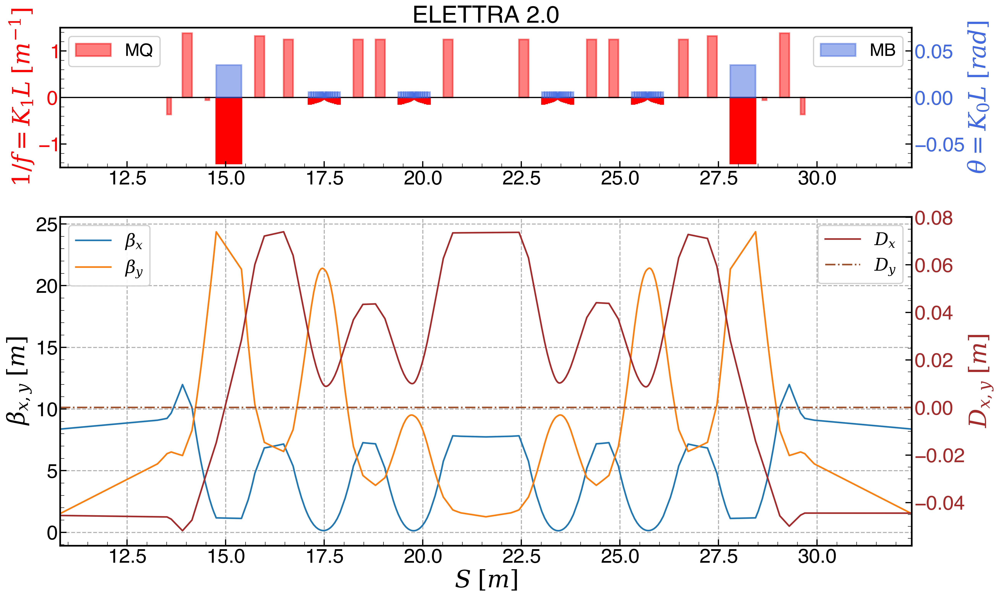

In [3]:
s_start = twiss[twiss.name == "left_marker:1"]["s"][0]
s_end = twiss[twiss.name == "right_marker:1"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
    savefig="raw_no_AB.pdf",
)

In [4]:
madx.input(
    """
match, sequence=ring;
vary, name=k1_bqf1, step=1e-6;
vary, name=k1_bqf2, step=1e-6;
vary, name=k1_bqf3, step=1e-6;
vary, name=k1_bqf4, step=1e-6;
constraint, range=ll[1], dx=0, dy=0;
constraint, range=ll[3], dx=0, dy=0;
lmdif, calls=1000, tolerance=1e-21;
endmatch;


"""
)

True

2021-10-13 15:46:08 | INFO     | pyhdtoolkit.cpymadtools.plotters:638 - Plotting optics functions and machine layout


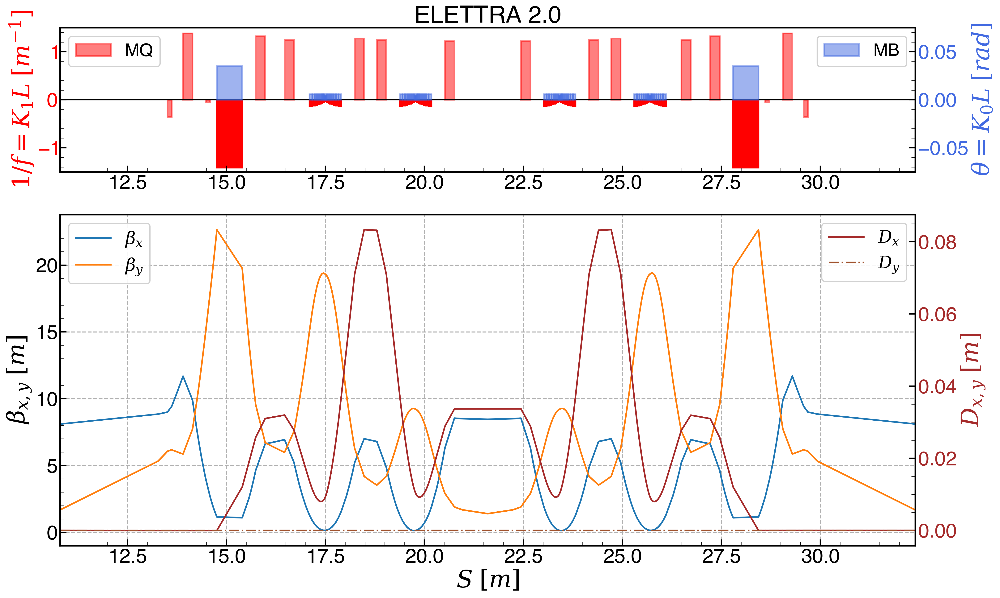

In [5]:
s_start = twiss[twiss.name == "left_marker:1"]["s"][0]
s_end = twiss[twiss.name == "right_marker:1"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

In [9]:
# Compute Emittance

madx.input(
    f"""
emit, deltap={madx.globals.deltap};
emit, deltap={madx.globals.deltap};
"""
)

# Stop MAD-X instance

# madx.quit()

# Get the emittance from the standard output

ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)


print(f"Emittance x : {ex*1e12} pm")

Emittance x : 1199.229 pm


In [10]:
madx.twiss(sequence='ring')
twiss = madx.table.twiss.dframe()

twiss[twiss.name=='left_marker:1'][['betx','bety','dx','dy']]

,betx,bety,dx,dy
left_marker,8.101014,1.677595,-7.688409e-12,0.0


In [15]:
madx.input('''
use, sequence=ring;

match, range=left_marker/middle_marker, betx=8.101014, bety=1.677595, dx=0, dy=0;

vary, name=k1_qd1, step=1e-6, upper=0;
vary, name=k1_qf1, step=1e-6, lower=0;
vary, name=k1_qd2, step=1e-6, upper=0;
vary, name=k1_qf2, step=1e-6, lower=0;

constraint, range=middle_marker, betx=7.726541, bety=1.181956, dx=0.056474;
constraint, range=left_marker, dx=0;



lmdif, calls=10000, tolerance=1e-21;
endmatch;

use, sequence=ring;
twiss;

''')
print(madx.globals.tar)

0.023656657267245185


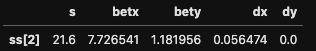

In [22]:
madx.input('''
use, sequence=ring;

match, range=left_marker/right_marker, betx=8.101014, bety=1.677595, dx=0, dy=0;

vary, name=k1_qd1, step=1e-6;
vary, name=k1_qf1, step=1e-6;
vary, name=k1_qd2, step=1e-6;
vary, name=k1_qf2, step=1e-6;

constraint, range=middle_marker, betx=7.726541, bety=1.181956;
constraint, range=left_marker, dx=0;
constraint, range=right_marker, dx=0;



jacobian, calls=10000, tolerance=1e-21;
endmatch;

use, sequence=ring;
twiss;

''')
print(madx.globals.tar)

6.782849249284089e-25


In [25]:
madx.twiss(sequence='ring')
twiss = madx.table.twiss.dframe()

twiss[twiss.name=='left_marker:1'][['betx','bety','dx','dy']]

,betx,bety,dx,dy
left_marker,10.683232,1.965889,-0.000088,0.0


In [26]:
madx.input('''
use, sequence=ring;

match, range=left_marker/right_marker, betx=10.683232, bety=1.965889, dx=-0.000088, dy=0;

vary, name=k1_qd1, step=1e-6;
vary, name=k1_qf1, step=1e-6;
vary, name=k1_qd2, step=1e-6;
vary, name=k1_qf2, step=1e-6;

constraint, range=left_marker/right_marker, dx<0.08;


jacobian, calls=10000, tolerance=1e-21;
endmatch;

use, sequence=ring;
twiss;

''')
print(madx.globals.tar)

0.0


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


2021-10-13 15:45:34 | INFO     | pyhdtoolkit.cpymadtools.plotters:638 - Plotting optics functions and machine layout


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
No handles with labels found to put in legend.
No handles with labels found to put in legend.


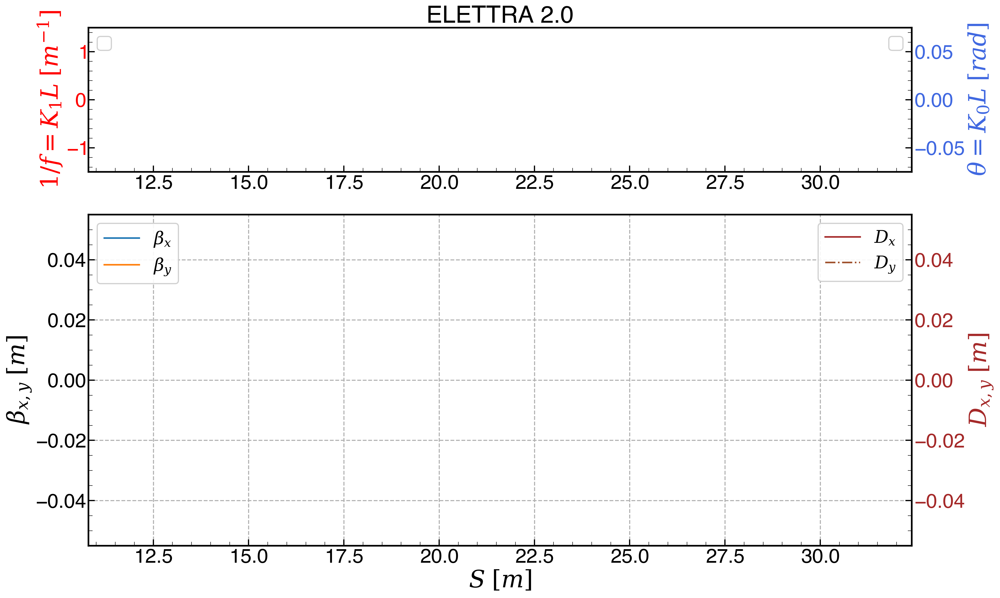

In [27]:
s_start = twiss[twiss.name == "left_marker:1"]["s"][0]
s_end = twiss[twiss.name == "right_marker:1"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

In [24]:
# Compute Emittance

madx.input(
    f"""
emit, deltap={madx.globals.deltap};
emit, deltap={madx.globals.deltap};
"""
)

# Stop MAD-X instance

# madx.quit()

# Get the emittance from the standard output

ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)


print(f"Emittance x : {ex*1e12} pm")

Emittance x : 1183.6925 pm


---

In [9]:
k1_ab_0 = 5.191616161616161
delta_ab_max = 0.15
n_points = 100

k1_ab_scan = np.linspace(k1_ab_0 - delta_ab_max, k1_ab_0 + delta_ab_max, n_points)

In [10]:
emit_ex_results = {}

for k in k1_ab_scan:
    madx.globals.k1_bqf1 = k
    madx.globals.k1_bqf2 = k
    madx.globals.k1_bqf3 = k
    madx.globals.k1_bqf4 = k
    try:
        madx.twiss(sequence="ring")
        madx.input(
            f"""
        emit, deltap={madx.globals.deltap};
        emit, deltap={madx.globals.deltap};
        """
        )
        ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)
        emit_ex_results[k] = ex
    except TwissFailed:
        LOGGER.debug(f"Twiss failed when using k = {k} for k1_vader")
        emit_ex_results[k] = np.nan

++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ E

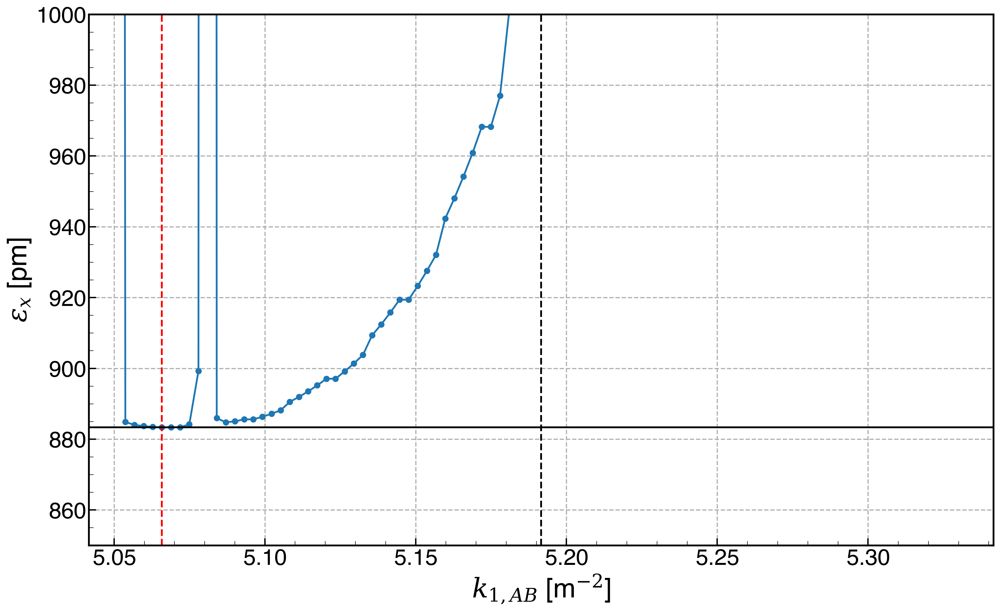

In [22]:
res_df = pd.DataFrame(data=emit_ex_results.values(), index=emit_ex_results.keys())

plt.plot(res_df.index, res_df[0].to_numpy()*1e12, '-o', lw=2)
plt.axvline(x=k1_ab_0, ls="--", c="k", lw=2)
plt.axvline(x=res_df[0].idxmin(), ls="--", c="r", lw=2)
plt.axhline(y=res_df.min()[0]*1e12, ls="-", c="k", lw=2)
plt.ylabel('$\\epsilon_x$ [pm]')
plt.xlabel('$k_{1,AB}$ [m$^{-2}$]')
plt.ylim(850,1000)
plt.xlim(k1_ab_scan[0], k1_ab_scan[-1]);

In [23]:
k1_ab_opt = res_df[0].idxmin()

In [24]:
madx.quit()

---

In [31]:
k1_ab_opt = 5.065858585858585

In [25]:
if os.path.exists("stdout.out"):
    os.remove("stdout.out")

# Launch MAD-X Session
with open("stdout.out", "w") as f:
    madx = Madx(stdout=f)

# Read parameters

from config import parameters, settings

for i in parameters.keys():
    madx.globals[i] = parameters[i]

# Call sequence and optics

madx.call("elettra2_v15_VADER_2.3T.madx")
madx.call("optics_elettra2_v15_VADER_2.3T.madx")

# Optimal AB k1
madx.globals.k1_bqf1 = k1_ab_opt
madx.globals.k1_bqf2 = k1_ab_opt
madx.globals.k1_bqf3 = k1_ab_opt
madx.globals.k1_bqf4 = k1_ab_opt


# Initial twiss

madx.use(sequence="ring")
madx.twiss(sequence="ring", table="init_twiss")

# Compute Emittance

madx.input(
    f"""
emit, deltap={madx.globals.deltap};
emit, deltap={madx.globals.deltap};
"""
)

# Get the emittance from the standard output

ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)


print(f"Emittance x : {ex*1e12} pm")

twiss = madx.table.init_twiss.dframe()


# Let's install some markers

madx.input(
    """
left_marker: marker;
right_marker: marker;
middle_marker: marker;

use, sequence=ring;
seqedit, sequence=ring;
flatten;
install, element=left_marker, at=10.8;
install, element=middle_marker, at=21.6;
install, element=right_marker, at=32.4;
flatten;
endedit;
"""
)

madx.use(sequence="ring")
madx.twiss(sequence="ring")
twiss = madx.table.twiss.dframe()

Emittance x : 883.3235199999999 pm


2021-10-13 12:23:58 | INFO     | pyhdtoolkit.cpymadtools.plotters:638 - Plotting optics functions and machine layout


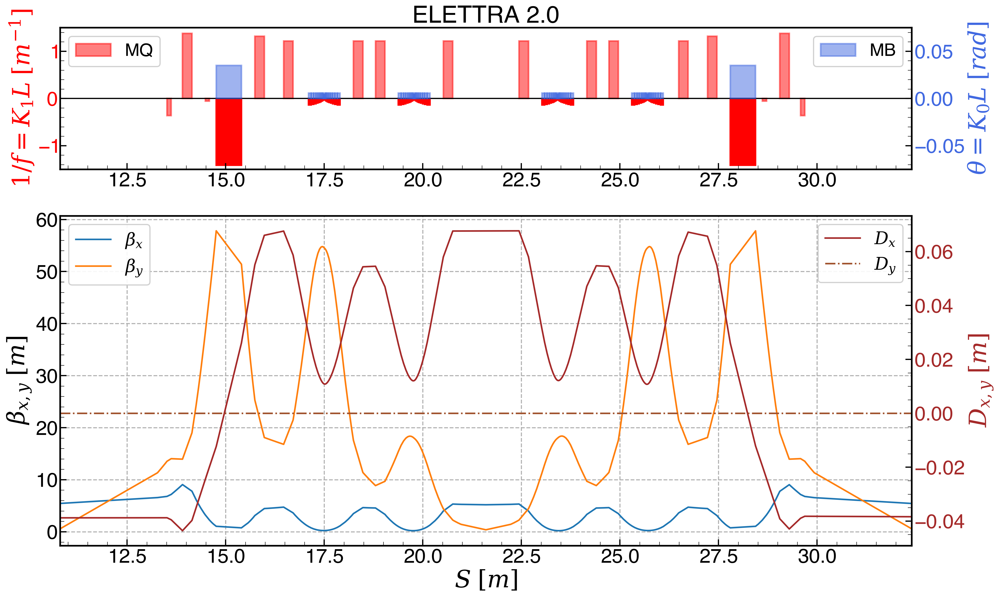

In [26]:
s_start = twiss[twiss.name == "left_marker:1"]["s"][0]
s_end = twiss[twiss.name == "right_marker:1"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

In [27]:
twiss=madx.table.twiss.dframe()

In [28]:
twiss[twiss.name=='middle_marker:1'][['betx','bety','dx','dy']]

,betx,bety,dx,dy
middle_marker,5.188053,0.377908,0.067657,0.0


In [29]:
# match

madx.input(
    """

use, sequence=ring;

match, range=middle_marker/right_marker, betx=5.188053, bety=0.377908, dx=0.067657, dy=0;

vary, name=k1_qd1, step=1e-10, upper=0;
vary, name=k1_qf1, step=1e-10, lower=0;
vary, name=k1_qd2, step=1e-10, upper=0;
vary, name=k1_qf2, step=1e-10, lower=0;

constraint, range=middle_marker/right_marker, bety<30.0;



lmdif, calls=2000, tolerance=1e-21;
endmatch;

use, sequence=ring;
twiss;
"""
)

print(madx.globals.tar)

9693.540257834211


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


---

In [11]:
# match

madx.input(
    """

use, sequence=ring;

match, range=middle_marker/right_marker, betx=7.69552, bety=0.219958, dx=0.063044, dy=0;

vary, name=k1_qd1, step=1e-10, upper=0;
vary, name=k1_qf1, step=1e-10, lower=0;
vary, name=k1_qd2, step=1e-10, upper=0;
vary, name=k1_qf2, step=1e-10, lower=0;

constraint, range=right_marker, betx=8.373589, bety=1.403831, dx=0, dy=0;



lmdif, calls=2000, tolerance=1e-21;
endmatch;

use, sequence=ring;
twiss;
"""
)

print(madx.globals.tar)

0.07669527055335341


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


In [4]:
# match

madx.input(
    """

use, sequence=ring;

match, range=middle_marker/right_marker, betx=7.69552, bety=0.219958, dx=0.063044, dy=0;

vary, name=k1_qd1, step=1e-10, upper=0;
vary, name=k1_qf1, step=1e-10, lower=0;
!vary, name=k1_qd2, step=1e-10, upper=0;
!vary, name=k1_qf2, step=1e-10, lower=0;
!vary, name=k1_bqf1, step=1e-10, lower=5, upper=6;
!vary, name=k1_bqf2, step=1e-10, lower=5, upper=6;
!vary, name=k1_bqf3, step=1e-10, lower=5, upper=6;
!vary, name=k1_bqf4, step=1e-10, lower=5, upper=6;
!vary, name=k1_vader, step=1e-10;
vary, name=k1_bf1, step=1e-10;
vary, name=angle_bf1, step=1e-10;


!constraint, range=middle_marker/right_marker, bety<30.0;
constraint, range=right_marker, betx=8.373589, bety=1.403831, dx=0, dy=0;



jacobian, calls=2000, tolerance=1e-21;
endmatch;

use, sequence=ring;
twiss;
"""
)

print(madx.globals.tar)

1.3561432239588585e-22


2021-10-13 10:11:51 | INFO     | pyhdtoolkit.cpymadtools.plotters:638 - Plotting optics functions and machine layout


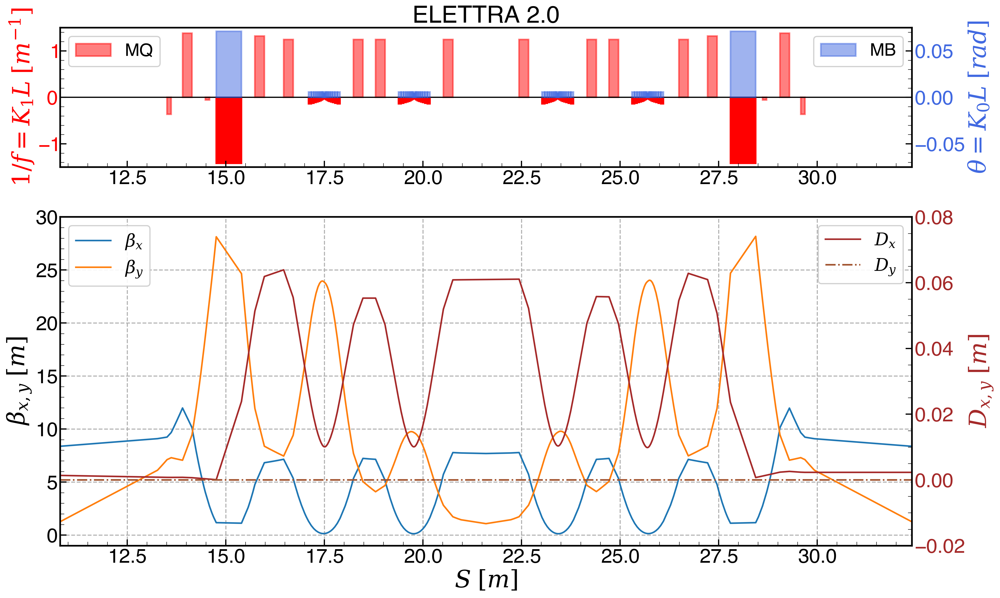

In [6]:
s_start = twiss[twiss.name == "ll:1"]["s"][0]
s_end = twiss[twiss.name == "ll:3"]["s"][0]

# disp_ylim=(-0.02,0.08)

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=(-0.02, 0.08),
    beta_ylim=(-1, 30),
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

In [8]:
madx.input(
    """
match, sequence=ring;
vary, name=k1_qd1, step=1e-10;
vary, name=k1_qf1, step=1e-10;
vary, name=k1_qd2, step=1e-10;
vary, name=k1_qf2, step=1e-10;
constraint, range=ll[1], dx=0, dy=0;
constraint, range=ll[3], dx=0, dy=0;
lmdif, calls=1000, tolerance=1e-21;
endmatch;


"""
)

True

In [9]:
print(madx.globals.tar)

1.6103704941220518e-07


2021-10-13 10:16:41 | INFO     | pyhdtoolkit.cpymadtools.plotters:638 - Plotting optics functions and machine layout


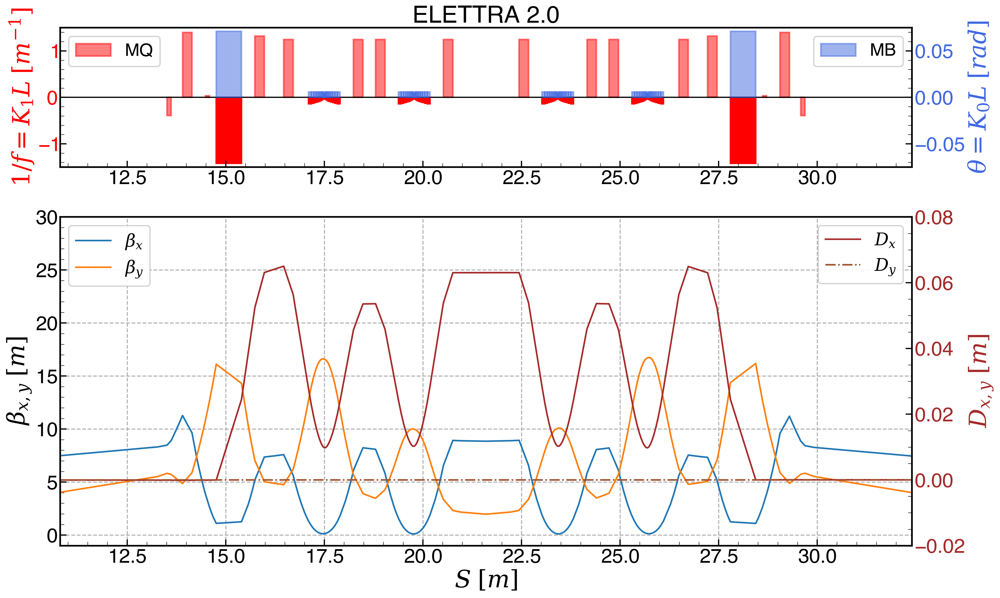

In [10]:
s_start = twiss[twiss.name == "ll:1"]["s"][0]
s_end = twiss[twiss.name == "ll:3"]["s"][0]

# disp_ylim=(-0.02,0.08)

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=(-0.02, 0.08),
    beta_ylim=(-1, 30),
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

In [11]:
# Compute Emittance

madx.input(
    f"""
emit, deltap={madx.globals.deltap};
emit, deltap={madx.globals.deltap};
"""
)

# Stop MAD-X instance

# madx.quit()

# Get the emittance from the standard output

ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)


print(f"Emittance x : {ex*1e12} pm")

Emittance x : 1005.6139000000001 pm


In [8]:
# match

madx.input(
    """

use, sequence=ring;

match, range=middle_marker/right_marker, betx=7.69552, bety=0.219958, dx=0.063044, dy=0;

vary, name=k1_qd1, step=1e-10, upper=0;
vary, name=k1_qf1, step=1e-10, lower=0;
vary, name=k1_qd2, step=1e-10, upper=0;
vary, name=k1_qf2, step=1e-10, lower=0;
vary, name=k1_bqf1, step=1e-10, lower=5, upper=6;
vary, name=k1_bqf2, step=1e-10, lower=5, upper=6;
vary, name=k1_bqf3, step=1e-10, lower=5, upper=6;
vary, name=k1_bqf4, step=1e-10, lower=5, upper=6;
vary, name=k1_vader, step=1e-10;
vary, name=k1_bf1, step=1e-10;


constraint, range=middle_marker/right_marker, bety<30.0;
constraint, range=right_marker, betx=8.373589, bety=1.403831, dx=0, dy=0;



jacobian, calls=1000, tolerance=1e-21;
endmatch;

use, sequence=ring;
twiss;
"""
)

print(madx.globals.tar)

192280.25915586736


In [4]:
twiss[twiss.name == "middle_marker:1"][["betx", "bety", "dx", "dy"]]

,betx,bety,dx,dy
middle_marker,7.69552,0.219958,0.063044,0.0


In [6]:
# match

madx.input(
    """

use, sequence=ring;

!match, range=middle_marker/right_marker, betx=7.726541, bety=1.181956, dx=0.056474, dy=0;
match, range=middle_marker/right_marker, betx=7.69552, bety=0.219958, dx=0.063044, dy=0;

!vary, name=k1_qd1, step=1e-10, lower=-4.5, upper=-2;
!vary, name=k1_qf1, step=1e-10, lower=5, upper=7;
!vary, name=k1_qd2, step=1e-10, lower=-2, upper=0;
!vary, name=k1_qf2, step=1e-10, lower=5, upper=7;

!vary, name=k1_bqf1, step=1e-10, lower=5, upper=5;
!vary, name=k1_bqf2, step=1e-10, lower=5, upper=6;
!vary, name=k1_bqf3, step=1e-10, lower=5, upper=6;
!vary, name=k1_bqf4, step=1e-10, lower=5, upper=6;

vary, name=k1_qd2, step=1e-10;
vary, name=k1_qf2, step=1e-10;
vary, name=k1_bf1, step=1e-10;
vary, name=k1_vader, step=1e-10;




!constraint, range=middle_marker/right_marker, bety<30.0;
constraint, range=right_marker, betx=8.373589, bety=1.403831, dx=0, dy=0;



jacobian, calls=5000, tolerance=1e-21;
endmatch;

use, sequence=ring;
twiss;
"""
)

print(madx.globals.tar)

3.4813727406155115e-23


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


In [8]:
# match

madx.input(
    """

use, sequence=ring;

match, range=left_marker/right_marker, betx=8.366583, bety=0.239541, dx=-0.008524, dy=0;
!match, range=left_marker/right_marker;

vary, name=k1_qd1, step=1e-10;
vary, name=k1_qf1, step=1e-10;
vary, name=k1_qd2, step=1e-10;
vary, name=k1_qf2, step=1e-10;
vary, name=k1_bqf1, step=1e-10;
vary, name=k1_bqf2, step=1e-10;
vary, name=k1_bqf3, step=1e-10;
vary, name=k1_bqf4, step=1e-10;
vary, name=k1_vader, step=1e-10;


constraint, range=left_marker/right_marker, bety<30.0;
constraint, range=middle_marker, betx=7.726541, bety=1.181956, dx=0.056474, dy=0;
constraint, range=right_marker, betx=8.373589, bety=1.403831, dx=0, dy=0;
constraint, range=left_marker, betx=8.36888, bety=1.410758, dx=0, dy=0;
constraint, range=qd1_s01.2[1], dx=0;
constraint, range=qd1_s02.1[2], dx=0;



lmdif, calls=20000, tolerance=1e-21;
endmatch;

use, sequence=ring;
twiss;
"""
)

print(madx.globals.tar)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/Applications/anaconda3/envs/ELETTRA/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3441, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/d6/448d7b9j5mv3cj6th4nxngp80000gn/T/ipykernel_61145/4100561058.py", line 3, in <module>
    madx.input('''
  File "/Applications/anaconda3/envs/ELETTRA/lib/python3.8/site-packages/cpymad/madx.py", line 278, in input
    return self._libmadx.input(text)
  File "/Applications/anaconda3/envs/ELETTRA/lib/python3.8/site-packages/minrpc/client.py", line 159, in DeferredMethod
    return self.__client._request('function_call', self.__module,
  File "/Applications/anaconda3/envs/ELETTRA/lib/python3.8/site-packages/minrpc/client.py", line 107, in _request
    response = self._communicate((kind, args))
  File "/Applications/anaconda3/envs/ELETTRA/lib/python3.8/site-packages/minrpc/client.py", line 117, in _communicate
    return self._conn.recv()
  File "/App

TypeError: object of type 'NoneType' has no len()

2021-10-13 10:04:24 | INFO     | pyhdtoolkit.cpymadtools.plotters:638 - Plotting optics functions and machine layout


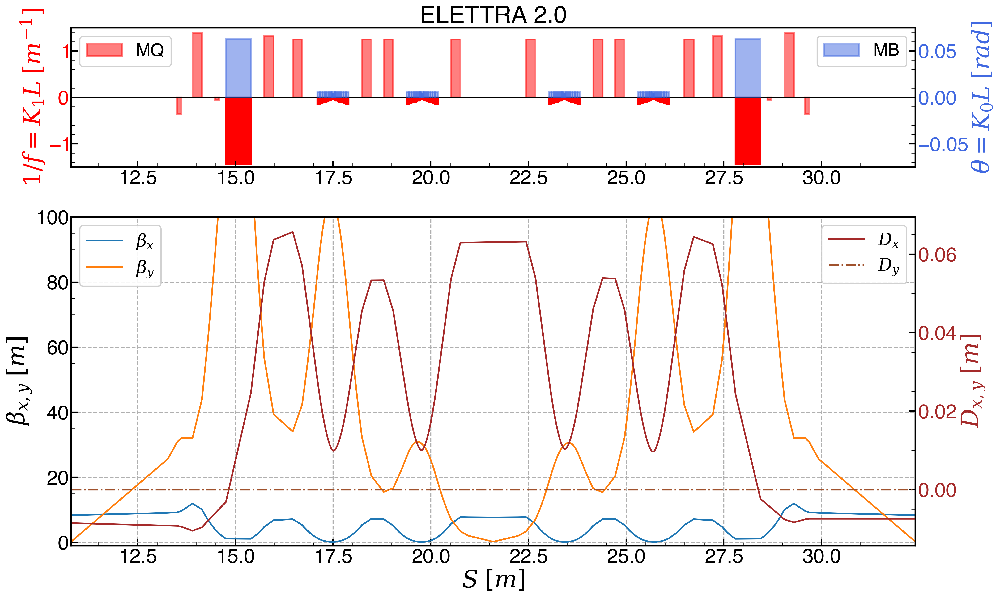

In [9]:
s_start = twiss[twiss.name == "ll:1"]["s"][0]
s_end = twiss[twiss.name == "ll:3"]["s"][0]

# disp_ylim=(-0.02,0.08)

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    beta_ylim=(-1, 100),
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

2021-10-11 16:22:53 | INFO     | pyhdtoolkit.cpymadtools.plotters:638 - Plotting optics functions and machine layout


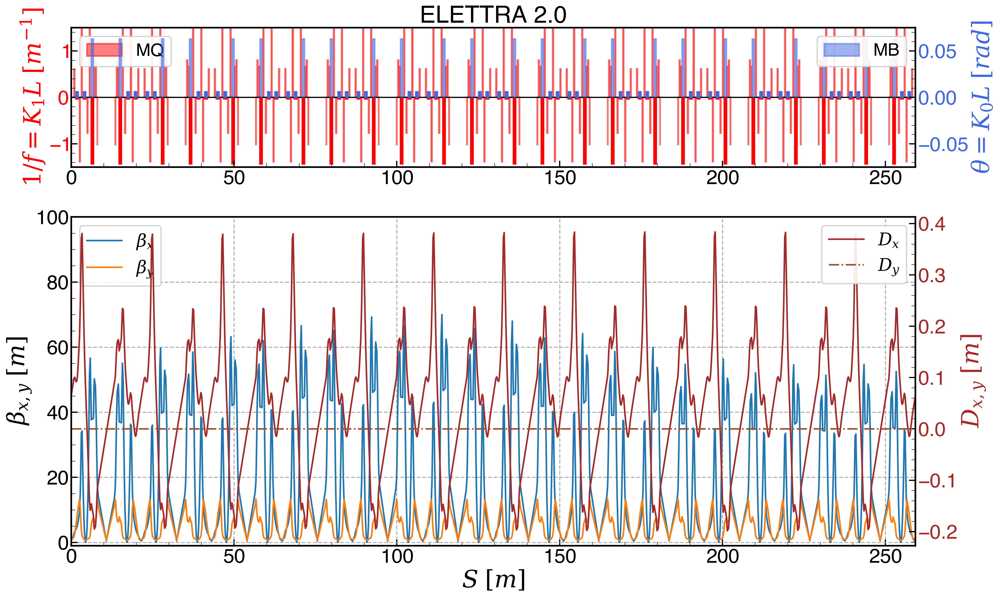

In [9]:
s_start = twiss[twiss.name == "ll:1"]["s"][0]
s_end = twiss[twiss.name == "ll:3"]["s"][0]

# disp_ylim=(-0.02,0.08)

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=None,
    disp_ylim=None,
    beta_ylim=(-1, 100),
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

In [ ]:
# match

madx.input(
    """

use, sequence=ring;

!match, range=left_marker/right_marker, betx=8.36888, bety=1.410758, dx=0, dy=0;
match, range=left_marker/right_marker;

vary, name=k1_qd1, step=1e-6;
vary, name=k1_qf1, step=1e-6;
vary, name=k1_qd2, step=1e-6;
vary, name=k1_qf2, step=1e-6;
vary, name=k1_bqf1, step=1e-6;
vary, name=k1_bqf2, step=1e-6;
vary, name=k1_bqf3, step=1e-6;
vary, name=k1_bqf4, step=1e-6;

!constraint, range=left_marker/right_marker, bety<30.0;
!constraint, range=middle_marker, betx=7.726541, bety=1.181956, dx=0.056474, dy=0;
!constraint, range=right_marker, betx=8.373589, bety=1.403831, dx=0, dy=0;
!constraint, range=left_marker, betx=8.36888, bety=1.410758, dx=0, dy=0;
constraint, range=qd1_s01.2[1], dx=0;
constraint, range=qd1_s02.1[2], dx=0;



lmdif, calls=10000, tolerance=1e-21;
endmatch;

use, sequence=ring;
twiss;
"""
)

In [7]:
# Compute Emittance

madx.input(
    f"""
emit, deltap={madx.globals.deltap};
emit, deltap={madx.globals.deltap};
"""
)

# Stop MAD-X instance

# madx.quit()

# Get the emittance from the standard output

ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)


print(f"Emittance x : {ex*1e12} pm")

Emittance x : 58743.78200000001 pm


In [6]:
twiss = madx.table.twiss.dframe()

In [7]:
twiss[twiss.name == "left_marker:1"][["betx", "bety", "dx", "dy"]]

,betx,bety,dx,dy
left_marker,8.378247,0.106287,0.000165,0.0


In [17]:
twiss[twiss.name == "right_marker:1"][["betx", "bety", "dx", "dy"]]

,betx,bety,dx,dy
right_marker,7.899866,1.088047,-0.00663,0.0


In [18]:
twiss[twiss.name == "middle_marker:1"][["betx", "bety", "dx", "dy"]]

,betx,bety,dx,dy
middle_marker,7.490724,0.974621,0.062128,0.0


In [22]:
init_twiss = madx.table.init_twiss.dframe()

2021-10-08 12:16:12 | INFO     | pyhdtoolkit.cpymadtools.plotters:638 - Plotting optics functions and machine layout


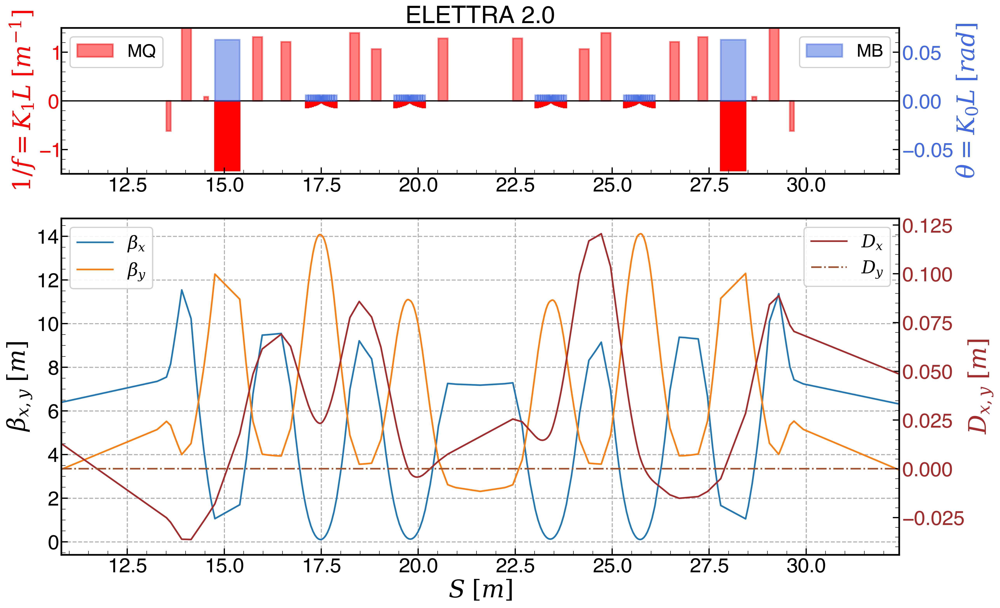

In [18]:
s_start = twiss[twiss.name == "ll:1"]["s"][0]
s_end = twiss[twiss.name == "ll:3"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

2021-10-08 11:51:24 | INFO     | pyhdtoolkit.cpymadtools.plotters:638 - Plotting optics functions and machine layout


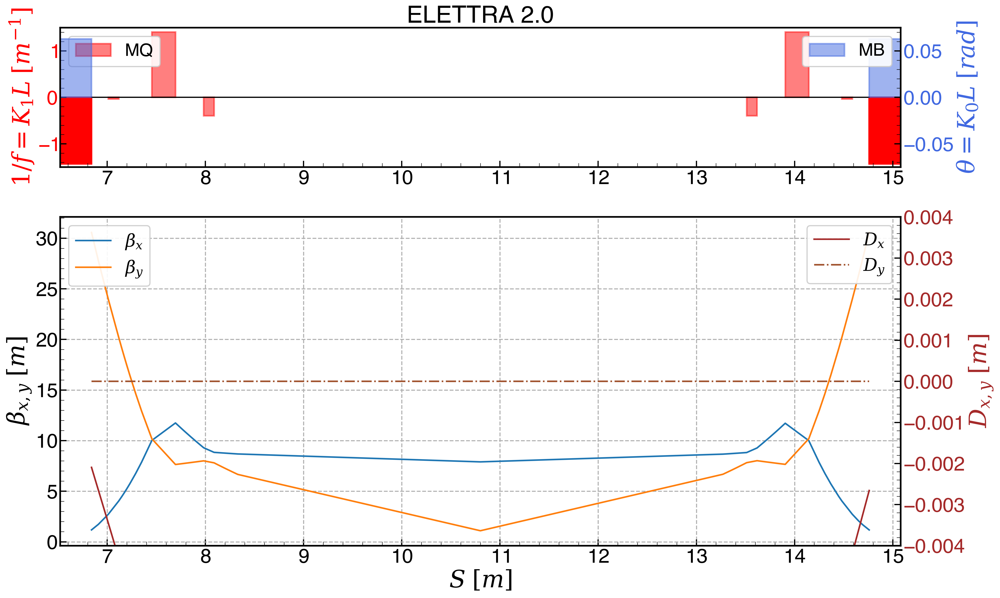

In [13]:
s_start = twiss[twiss.name == "bf1:1"]["s"][0] - twiss[twiss.name == "bf1:1"]["l"][0] / 2
s_end = twiss[twiss.name == "bf1:2"]["s"][0] - twiss[twiss.name == "bf1:2"]["l"][0] / 2

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=(-0.004, 0.004),
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

In [7]:
# Compute Emittance

madx.input(
    f"""
emit, deltap={madx.globals.deltap};
emit, deltap={madx.globals.deltap};
"""
)

# Stop MAD-X instance

# madx.quit()

# Get the emittance from the standard output

ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)


print(f"Emittance x : {ex*1e12} pm")

Emittance x : 899.28991 pm


2021-10-08 11:57:37 | INFO     | pyhdtoolkit.cpymadtools.plotters:638 - Plotting optics functions and machine layout


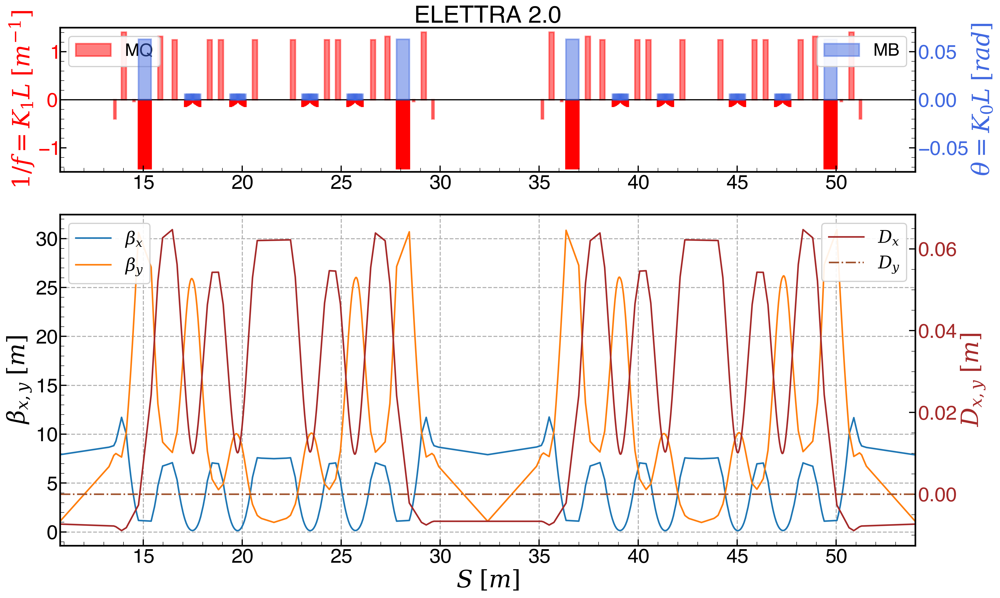

In [21]:
s_start = twiss[twiss.name == "ll:1"]["s"][0]
s_end = twiss[twiss.name == "ll:5"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

In [11]:
madx.twiss(sequence="ring", table="test_twiss");

In [12]:
test_twiss = madx.table.test_twiss.dframe()

In [13]:
s0 = test_twiss[test_twiss.name == "left_marker:1"]["s"][0]
s1 = test_twiss[test_twiss.name == "right_marker:1"]["s"][0]

In [15]:
test_twiss[(test_twiss.s >= s0) & (test_twiss.s <= s1) & (test_twiss.keyword == "quadrupole")]

,name,keyword,s,betx,alfx,mux,bety,alfy,muy,x,...,sig54,sig55,sig56,sig61,sig62,sig63,sig64,sig65,sig66,n1
qd1_s01.2,qd1_s01.2:1,quadrupole,13.618,9.665626,-3.794427,1.472068,32.057944,0.018371,0.726092,-1.799530e-06,...,-2.016793e-17,0.003234,-1.776166e-06,0.000526,2.105497e-04,5.040741e-17,-5.016748e-17,-1.776166e-06,0.00031,0.0
qf1_s01.2,qf1_s01.2:1,quadrupole,14.145,10.126651,11.081248,1.479594,43.895002,-54.694258,0.728593,-1.191420e-06,...,-1.187504e-15,0.003234,-1.776087e-06,0.000540,-5.892933e-04,2.942658e-17,-6.197760e-18,-1.776087e-06,0.00031,0.0
qd2_s01.2,qd2_s01.2:1,quadrupole,14.588,2.726266,5.515351,1.493063,105.140165,-78.988852,0.729628,-1.125200e-08,...,-1.108773e-15,0.003234,-1.775388e-06,0.000280,-5.718500e-04,2.660004e-17,-7.714301e-18,-1.775388e-06,0.00031,0.0
qf2_s01.2,qf2_s01.2:1,quadrupole,15.980,6.825775,-0.291902,1.926096,39.441441,5.671261,0.732064,3.862917e-06,...,1.120541e-16,0.003831,-2.730768e-06,-0.000397,-3.965760e-05,-1.100525e-17,-4.364154e-17,-2.730768e-06,0.00031,0.0
bqf1_s01.2,bqf1_s01.2:1,quadrupole,16.710,5.367674,7.035620,1.943134,42.341560,-42.994535,0.735247,2.413690e-06,...,-9.801459e-16,0.003831,-2.730581e-06,-0.000365,4.598706e-04,-4.836248e-17,-9.274193e-17,-2.730581e-06,0.00031,0.0
bqf2_s01.2,bqf2_s01.2:1,quadrupole,18.480,7.236163,0.166580,2.374604,20.543771,8.342338,0.740334,-9.045365e-06,...,2.539207e-16,0.003630,-6.467016e-07,0.000372,3.196735e-05,-7.479428e-17,-3.218528e-17,-6.467016e-07,0.00031,0.0
bqf3_s01.2,bqf3_s01.2:1,quadrupole,19.040,5.176448,7.257291,2.387662,16.683831,-12.435009,0.745675,-7.062741e-06,...,-4.922541e-16,0.003630,-6.463004e-07,0.000334,-4.253032e-04,-1.062219e-16,-1.484140e-16,-6.463004e-07,0.00031,0.0
bqf4_s01.2,bqf4_s01.2:1,quadrupole,20.760,7.785525,0.104588,2.823672,3.456803,3.838247,0.765748,9.261838e-06,...,2.964350e-16,0.003742,-5.813476e-06,-0.000236,-4.813566e-05,-1.141122e-16,-2.244888e-17,-5.813476e-06,0.00031,0.0
bqf4_s02.1[2],bqf4_s02.1:2,quadrupole,22.680,5.729355,7.806568,2.863720,7.026865,-12.775865,1.192459,6.423136e-06,...,5.948632e-16,0.003742,-5.813256e-06,-0.000281,3.339203e-04,-1.809177e-16,-2.249290e-16,-5.813256e-06,0.00031,0.0
bqf3_s02.1[2],bqf3_s02.1:2,quadrupole,24.400,7.143133,-0.114851,3.300262,15.442491,-7.242443,1.207079,-1.234168e-05,...,2.647190e-16,0.003643,4.077778e-08,0.000202,6.117979e-05,-1.676887e-16,-7.189337e-18,4.077778e-08,0.00031,0.0


In [45]:
test_twiss[(test_twiss.s >= s0) & (test_twiss.s <= s1)]["bety"]

ll                  0.102063
left_marker         0.102063
left_marker[2]      0.102063
ll[2]              60.210130
dmon[17]           61.430840
                     ...    
mon[18]            61.362469
dmon[48]           60.139937
ll[3]               0.101495
right_marker        0.101495
right_marker[2]     0.101495
Name: bety, Length: 312, dtype: float64

(10.800000021538462, 32.40000006461531)

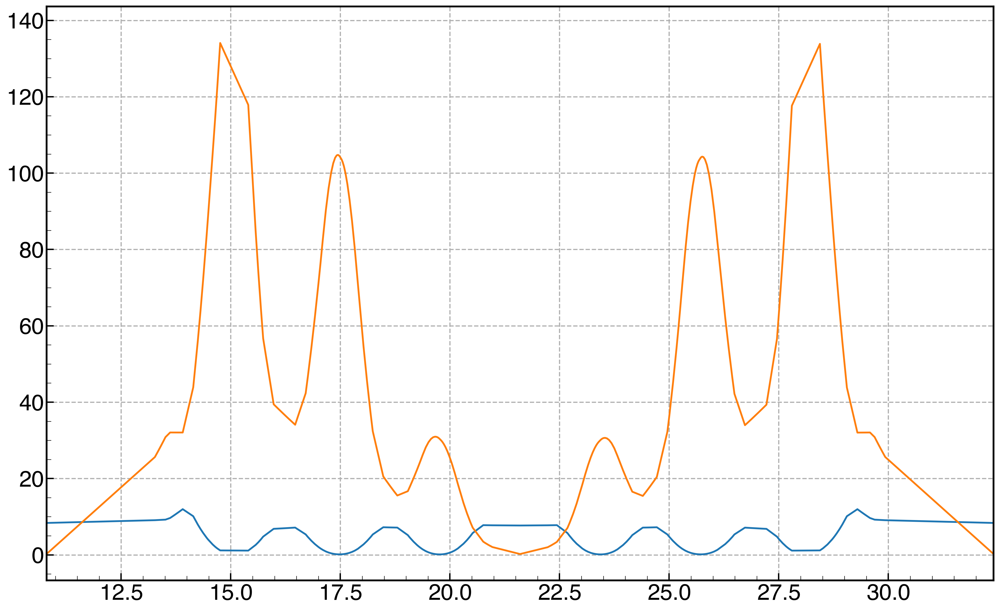

In [18]:
s_start = twiss[twiss.name == "ll:1"]["s"][0]
s_end = twiss[twiss.name == "ll:3"]["s"][0]

plt.plot(twiss["s"], twiss["betx"], lw=2)
plt.plot(twiss["s"], twiss["bety"], lw=2)
plt.xlim(s_start, s_end)

In [17]:
madx.input(
    """
match, sequence=ring;
vary, name=k1_qd1, step=1e-6;
vary, name=k1_qf1, step=1e-6;
vary, name=k1_qd2, step=1e-6;
vary, name=k1_qf2, step=1e-6;
vary, name=k1_bqf1, step=1e-6;
vary, name=k1_bqf2, step=1e-6;
vary, name=k1_bqf3, step=1e-6;
vary, name=k1_bqf4, step=1e-6;
constraint, range=ll[1], dx=0, dy=0, betx=8.36888, bety=1.410758;
constraint, range=ss[2], dx=0.056474, dy=0, betx=7.726541, bety=1.181956;
lmdif, calls=1000, tolerance=1e-10;
endmatch;


"""
)

++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


False

In [14]:
madx.input(
    """
match, sequence=ring;
vary, name=k1_bqf3, step=1e-6;
vary, name=k1_bqf4, step=1e-6;
constraint, range=ss[2], dx=0.056474, dy=0;
lmdif, calls=1000, tolerance=1e-10;
endmatch;


"""
)

True

2021-10-07 18:35:42 | INFO     | pyhdtoolkit.cpymadtools.plotters:638 - Plotting optics functions and machine layout


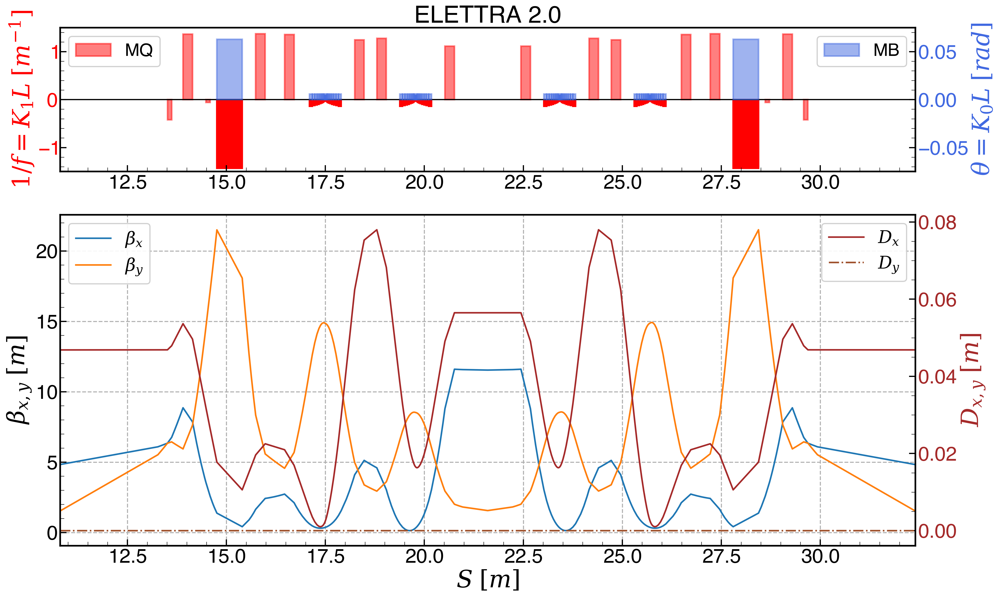

In [15]:
s_start = twiss[twiss.name == "ll:1"]["s"][0]
s_end = twiss[twiss.name == "ll:3"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

2021-10-07 16:55:18.709 | INFO     | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:638 - Plotting optics functions and machine layout
2021-10-07 16:55:18.710 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:639 - Getting Twiss dataframe from cpymad
2021-10-07 16:55:19.182 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_make_elements_groups:1319 - Getting different element groups dframes from MAD-X twiss table
2021-10-07 16:55:19.242 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_plot_machine_layout:1191 - Plotting machine layout
2021-10-07 16:55:20.434 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:665 - Plotting beta functions
2021-10-07 16:55:20.450 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:673 - Plotting dispersion functions
2021-10-07 16:55:20.472 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:687 - Setting ylim for dispersion plot
2021-10-07 16:55:20.473 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:691 - Setting xlim 

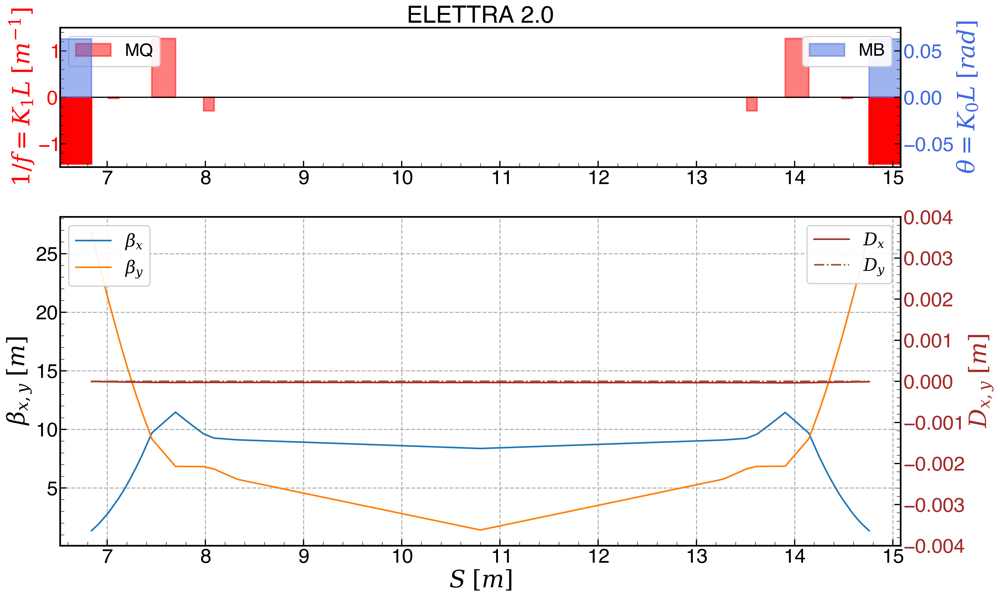

In [11]:
s_start = twiss[twiss.name == "bf1:1"]["s"][0] - twiss[twiss.name == "bf1:1"]["l"][0] / 2
s_end = twiss[twiss.name == "bf1:2"]["s"][0] - twiss[twiss.name == "bf1:2"]["l"][0] / 2

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=(-0.004, 0.004),
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

In [16]:
# Compute Emittance

madx.input(
    f"""
emit, deltap={madx.globals.deltap};
emit, deltap={madx.globals.deltap};
"""
)

# Stop MAD-X instance

# madx.quit()

# Get the emittance from the standard output

ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)


print(f"Emittance x : {ex*1e12} pm")

Emittance x : 1881.3494 pm


In [75]:
k1_vader_0 = -1.962662
delta_vader_max = 0.1
n_points = 100

k1_vader_scan = np.linspace(k1_vader_0 - delta_vader_max, k1_vader_0 + delta_vader_max, n_points)

import logging

from cpymad.madx import TwissFailed

LOGGER = logging.getLogger()

emit_ex_results = {}

for k in k1_vader_scan:
    madx.globals.k1_vader = k
    try:
        madx.twiss(sequence="ring")
        madx.input(
            f"""
        emit, deltap={madx.globals.deltap};
        emit, deltap={madx.globals.deltap};
        """
        )
        ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)
        emit_ex_results[k] = ex
    except TwissFailed:
        LOGGER.debug(f"Twiss failed when using k = {k} for k1_vader")
        emit_ex_results[k] = np.nan

res_df = pd.DataFrame(data=emit_ex_results.values(), index=emit_ex_results.keys())

res_df.plot()
plt.axvline(x=k1_vader_0, ls="--", c="k", lw=2)

In [ ]:
plt.plot(emit_ex_results)

In [45]:
madx.globals.k1_vader = k1_vader_0 - delta_vader_max
madx.twiss(sequence="ring")
madx.input(
    f"""
emit, deltap={madx.globals.deltap};
emit, deltap={madx.globals.deltap};
"""
)
ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)
print(f"Emittance x : {ex*1e12} pm")

Emittance x : 880.20312 pm


----

In [46]:
def H_function(twiss):
    """
    This functions returns an array corresponding to the dispersive invariant H(s). 
    
    Args:
        twiss (pd.DataFrame): DataFrame containing the twiss of interest
    
    Returns:
        A np.ndarray with the result of H(s)
    """
    # Get the np.array and calculate the missing ones
    s = twiss["s"].to_numpy()
    alfx = twiss["alfx"].to_numpy()
    betx = twiss["betx"].to_numpy()
    dx = twiss["dx"].to_numpy()

    dx_p = np.gradient(dx, s)
    gamma_x = (1 + alfx ** 2) / betx

    # Calculate H
    H = gamma_x * dx * dx + 2 * alfx * dx * dx_p + betx * dx_p * dx_p
    return H

In [47]:
curl_H = H_function(madx.table.twiss.dframe())

/Users/apoyet/anaconda3/envs/ELETTRA/lib/python3.8/site-packages/numpy/lib/function_base.py:1073: RuntimeWarning: divide by zero encountered in true_divide
  a = -(dx2)/(dx1 * (dx1 + dx2))
/Users/apoyet/anaconda3/envs/ELETTRA/lib/python3.8/site-packages/numpy/lib/function_base.py:1073: RuntimeWarning: invalid value encountered in true_divide
  a = -(dx2)/(dx1 * (dx1 + dx2))
/Users/apoyet/anaconda3/envs/ELETTRA/lib/python3.8/site-packages/numpy/lib/function_base.py:1074: RuntimeWarning: divide by zero encountered in true_divide
  b = (dx2 - dx1) / (dx1 * dx2)
/Users/apoyet/anaconda3/envs/ELETTRA/lib/python3.8/site-packages/numpy/lib/function_base.py:1074: RuntimeWarning: invalid value encountered in true_divide
  b = (dx2 - dx1) / (dx1 * dx2)
/Users/apoyet/anaconda3/envs/ELETTRA/lib/python3.8/site-packages/numpy/lib/function_base.py:1075: RuntimeWarning: divide by zero encountered in true_divide
  c = dx1 / (dx2 * (dx1 + dx2))
/Users/apoyet/anaconda3/envs/ELETTRA/lib/python3.8/site-pack

(10.800000021538462, 32.40000006461531)

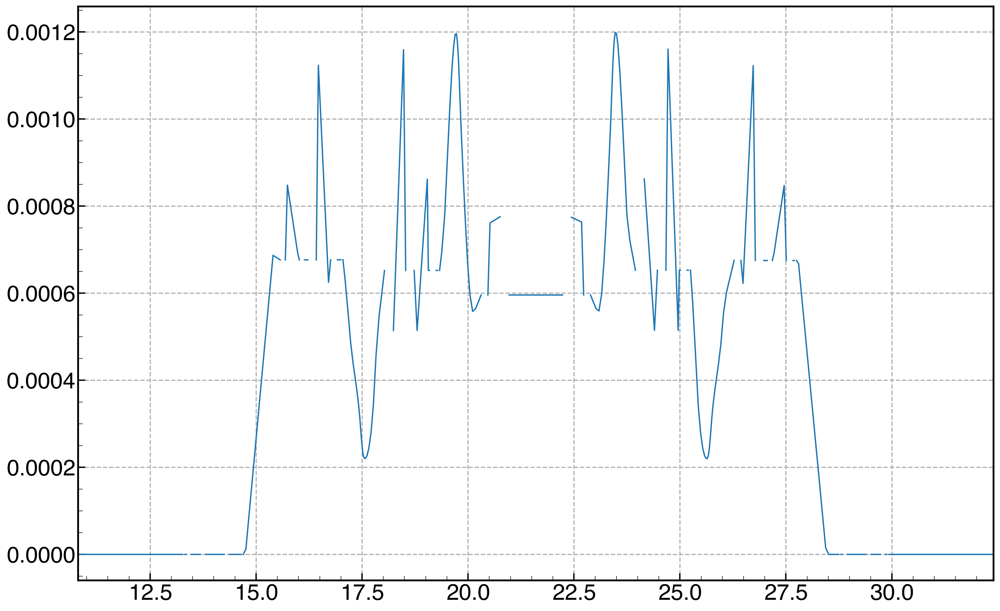

In [51]:
s_start = twiss[twiss.name == "ll:1"]["s"][0]
s_end = twiss[twiss.name == "ll:3"]["s"][0]

plt.plot(twiss["s"], curl_H)
plt.xlim(s_start, s_end)

In [11]:
madx.input(
    """

!match, range=ll[1]/ll[3], dx=0, dy=0;
match, sequence=ring;
vary, name=k1_qd1, step=1e-6;
vary, name=k1_qf1, step=1e-6;
vary, name=k1_qd2, step=1e-6;
vary, name=k1_qf2, step=1e-6;
constraint, range=ll[1], dx=0, dy=0;
constraint, range=ll[3], dx=0, dy=0;
lmdif, calls=1000, tolerance=1e-21;
endmatch;


"""
)

++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


False

2021-10-07 10:06:32.190 | INFO     | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:638 - Plotting optics functions and machine layout
2021-10-07 10:06:32.191 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:639 - Getting Twiss dataframe from cpymad
2021-10-07 10:06:32.669 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_make_elements_groups:1319 - Getting different element groups dframes from MAD-X twiss table
2021-10-07 10:06:32.734 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_plot_machine_layout:1191 - Plotting machine layout
2021-10-07 10:06:34.114 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:665 - Plotting beta functions
2021-10-07 10:06:34.130 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:673 - Plotting dispersion functions
2021-10-07 10:06:34.150 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:691 - Setting xlim for longitudinal coordinate


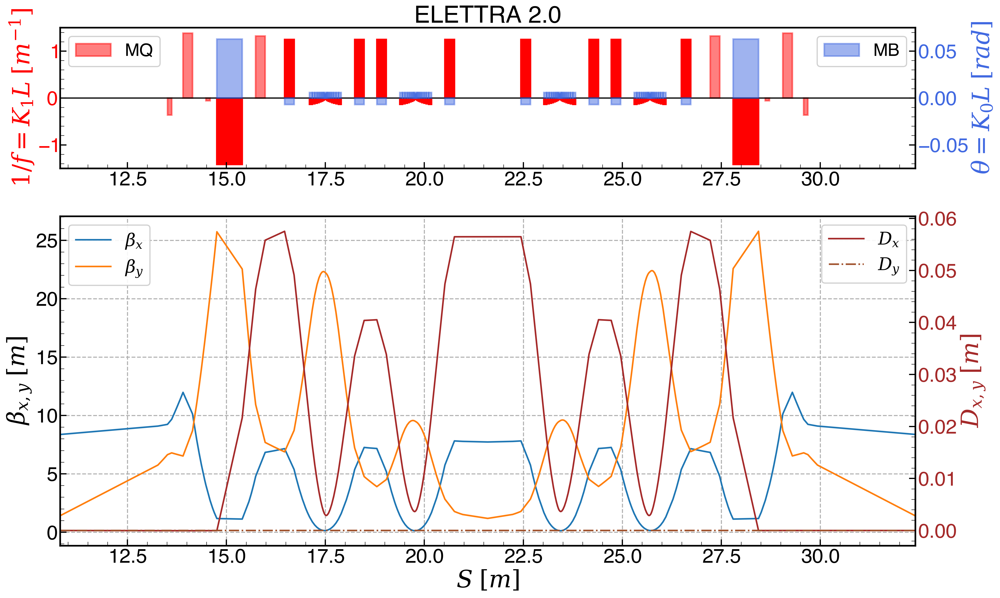

In [7]:
s_start = twiss[twiss.name == "ll:1"]["s"][0]
s_end = twiss[twiss.name == "ll:3"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

In [8]:
# Compute Emittance

madx.input(
    f"""
emit, deltap={madx.globals.deltap};
emit, deltap={madx.globals.deltap};
"""
)

# Stop MAD-X instance

# madx.quit()

# Get the emittance from the standard output

ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)


print(f"Emittance x : {ex*1e12} pm")

Emittance x : 155.66564 pm
